# ELG7186 - Fall 2022 - Assignment 2
## Due: <strong>Wednesday November 2<sup>th</sup> 2022 -- 11:59pm</strong>

The purpose of this assignment is to gain experience building and training neural networks. You will learn:
- Design and train a fully-connected neural network
- Train an existing CNN architecture using fine-tuning
- Visualize the trained model


### Submission Details
Submit your Jupyter notebook .ipynb file using Brightspace. Do not include any other files or images as they will not be reviewed.
<p>
<strong>Make certain that you run all the cells in the notebook you submit</strong> or you will loose marks.
</p>
<ul>
<li>You can submit multiple times, but only the most recent submission will be saved</li>
<li>Do not wait until the last minute to submit in case you have an unexpected issue</li>
<li>Review the late policy in the syllabus</li>
<li><strong>You must submit your own work</strong> and abide by the University of Ottawa policy on plagiarism and fraud</li>
</ul>


### DO NOT submit any images from the dataset

## Important packages

In [1]:
import kwargs as kwargs
import pandas as pd
import numpy as np #array operations

import sklearn as sk
from opt_einsum.backends import torch
from sklearn.metrics import accuracy_score , classification_report
from sklearn.model_selection import train_test_split
from sklearn.utils import shuffle

#Visualization
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px

import os #to iterate through directory and join path
import cv2 #to do images operations
from torch.utils.data import DataLoader
from tqdm import tqdm
from pathlib import Path
import random
from tkinter import Variable
import shutil
from livelossplot import PlotLossesKeras
#import tensorflow packages
import tensorflow as tf
from keras.models import Sequential
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import InputLayer
from keras.layers import Activation, Dense,Flatten
from tensorflow.keras.losses import CategoricalCrossentropy
from tensorflow.keras.optimizers import Adam
from tensorflow_addons.optimizers import AdamW
from keras.layers import Dropout
from tensorflow.keras.losses import CategoricalCrossentropy ,SparseCategoricalCrossentropy ,MeanSquaredError
import visualkeras
from tensorflow.keras.models import Model

C:\Users\LENOVO\AppData\Local\Programs\Python\Python310\lib\site-packages\tensorflow_addons\utils\ensure_tf_install.py:53: UserWarning: Tensorflow Addons supports using Python ops for all Tensorflow versions above or equal to 2.7.0 and strictly below 2.10.0 (nightly versions are not supported). 
 The versions of TensorFlow you are currently using is 2.10.0 and is not supported. 
Some things might work, some things might not.
If you were to encounter a bug, do not file an issue.
If you want to make sure you're using a tested and supported configuration, either change the TensorFlow version or the TensorFlow Addons's version. 
You can find the compatibility matrix in TensorFlow Addon's readme:
https://github.com/tensorflow/addons
  warnings.warn(


## Part 0. Data Preparation

To complete the assignment you will download the Caltech Bird dataset and devise an appropriate training set split. <b>You are free to sample from the dataset to reduce the overal training samples depending on your access to compute.</b> Again, the overall accuracy is less important than your  observations and comparisons.

Dataset: <a href="http://www.vision.caltech.edu/visipedia/CUB-200-2011.html">Caltech-UCSD Birds-200-2011</a> (Also posed on Brightspace)

The dataset contains annotations for various tasks. In this assignment you will use the categories for classification (species labels)

In this section:
<ul>
<li>Download the dataset as described above</li>
<li>Create your splits for your dataset (there is a split provided for the full dataset) </li>
<li>Visualize five samples of each class by plotting a grid using the matplotlib library.</li>
</ul>


In [2]:
PATH = Path("D:\DEBI\Projects\CV\CUB_200_2011\CUB_200_2011")
folder_path =  "./CUB_200_2011/CUB_200_2011/images"
files = os.listdir(PATH)
files

['attributes',
 'bounding_boxes.txt',
 'classes.txt',
 'images',
 'images.txt',
 'image_class_labels.txt',
 'parts',
 'README',
 'train_test_split.txt']

In [3]:
images = pd.read_csv(PATH/files[4], names= ["id", "image"],header=None, sep=" ")
labels = pd.read_csv(PATH/files[5],names= ["id", "label"] ,header=None, sep=" ")
train_test = pd.read_csv(PATH/files[8],names= ["id", "train_or_test"] ,header=None, sep=" ")
bounding = pd.read_csv(PATH/files[1],names= ["id",'1','2','3','4'] ,header=None, sep=" ")
data1 = pd.merge(images,labels,on='id')
data2 = pd.merge(train_test,bounding,on='id')
data = pd.merge(data1,data2)

data.drop('id', inplace=True ,axis=1)
data.head()

,image,label,train_or_test,1,2,3,4
0,001.Black_footed_Albatross/Black_Footed_Albatr...,1,0,60.0,27.0,325.0,304.0
1,001.Black_footed_Albatross/Black_Footed_Albatr...,1,1,139.0,30.0,153.0,264.0
2,001.Black_footed_Albatross/Black_Footed_Albatr...,1,0,14.0,112.0,388.0,186.0
3,001.Black_footed_Albatross/Black_Footed_Albatr...,1,1,112.0,90.0,255.0,242.0
4,001.Black_footed_Albatross/Black_Footed_Albatr...,1,1,70.0,50.0,134.0,303.0


In [5]:
train = data[data['train_or_test'] == 1 ]
test = data[data['train_or_test'] == 0 ]
train.drop('train_or_test', inplace=True ,axis=1)
test.drop('train_or_test', inplace=True ,axis=1)
train = train.sample(frac = 1,random_state = 0,ignore_index = True)
test = test.sample(frac = 1,random_state = 0,ignore_index = True)

train.head()

C:\Users\LENOVO\AppData\Local\Temp\ipykernel_19684\936786799.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  train.drop('train_or_test', inplace=True ,axis=1)
C:\Users\LENOVO\AppData\Local\Temp\ipykernel_19684\936786799.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  test.drop('train_or_test', inplace=True ,axis=1)


,image,label,1,2,3,4
0,192.Downy_Woodpecker/Downy_Woodpecker_0138_184...,192,129.0,64.0,219.0,421.0
1,072.Pomarine_Jaeger/Pomarine_Jaeger_0075_61349...,72,112.0,29.0,161.0,284.0
2,081.Pied_Kingfisher/Pied_Kingfisher_0017_72316...,81,95.0,61.0,259.0,227.0
3,016.Painted_Bunting/Painted_Bunting_0046_16535...,16,50.0,58.0,224.0,210.0
4,046.Gadwall/Gadwall_0012_30920.jpg,46,3.0,4.0,362.0,371.0


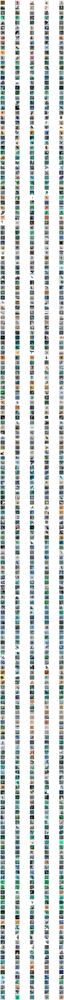

In [70]:
fig, axs = plt.subplots(200, 5,figsize=(14,200))
# axs = axs.flatten()
for Class in range(1, 201):
  r = np.where(train['label'] == Class)[0]
  im = np.take(train['image'],r[:5], axis=0)
  #-----------------------------------------#
  for i in range(5):
    path = folder_path+'/{}'.format(im.iloc[i])
    image = cv2.imread(path)
    image = cv2.resize(image,(128,128))
    axs[Class-1,i].imshow(image)
    axs[Class-1,i].axis('off')
plt.show()

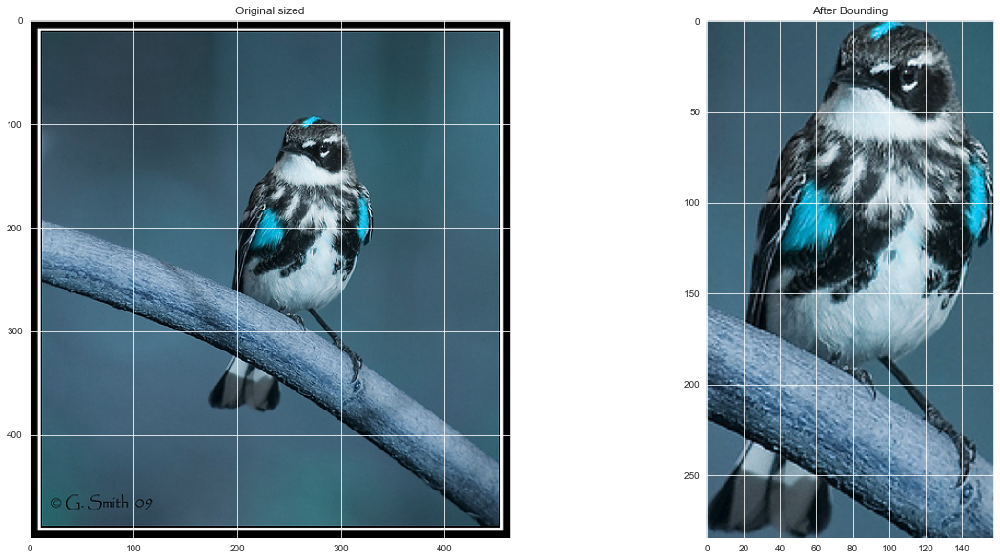

In [6]:
i=5
x,y,w,h = int(train['1'][i]),int(train['2'][i]), int(train['3'][i]),int(train['4'][i])

path = folder_path+'/{}'.format(train['image'][i])
fig, axes = plt.subplots(1, 2, figsize=(20,10))
img = cv2.imread(path)
axes[0].set_title('Original sized')
axes[1].set_title('After Bounding')
axes[0].imshow(img)

cropped_image = img[y:y+h, x:x+w]
axes[1].imshow(cropped_image)
plt.show()

In [24]:
folder_path =  "./CUB_200_2011/CUB_200_2011/images"
for i in range(len(train)) :
    foldername = train['image'][i].split('/')[0]
    imgname = train['image'][i].split('/')[1]
    path = folder_path+'/{}'.format(train['image'][i])
    x,y,w,h = int(train['1'][i]),int(train['2'][i]), int(train['3'][i]),int(train['4'][i])
    if not os.path.exists(f"data/train/{foldername}"):
        os.mkdir(f"data/train/{foldername}")
    img = cv2.imread(path)
    cropped_image = img[y:y+h, x:x+w]
    cv2.imwrite(f"data/train/{foldername}/{imgname}",cropped_image)

for i in range(len(test)) :
    foldername = test['image'][i].split('/')[0]
    imgname = train['image'][i].split('/')[1]
    path = folder_path+'/{}'.format(test['image'][i])
    x,y,w,h = int(test['1'][i]),int(test['2'][i]), int(test['3'][i]),int(test['4'][i])
    if not os.path.exists(f"data/test/{foldername}"):
        os.mkdir(f"data/test/{foldername}")
    img = cv2.imread(path)
    cropped_image = img[y:y+h, x:x+w]
    cv2.imwrite(f"data/test/{foldername}/{imgname}",cropped_image)

## Part 1. Perceptron (3 Marks)
For this section you will implement a fully connected neural network (multi-layer perceptron). To do this you will need to perform the following steps:
- Resize the images to be no larger than 32x32.
- Use the sequential model API in keras to build your network using dense layers (consider performance impacts of fully connected layers)
- You must decide an appropriate number of neurons and layers.
- Print a summary of your model configuration.


When your classifier is working:
- Plot a loss curve for training and test data
- Plot an accuracy curve for training and test data
- Provide a brief discussion of your results


In [29]:
train_path = "D:/DEBI/Projects/CV/data/train"
test_path = "D:/DEBI/Projects/CV/data/test"

In [30]:
IMG_SIZE = (32, 32)
BATCH_SIZE = 1024
num_epoch = 500

In [31]:
train_data = tf.keras.utils.image_dataset_from_directory(train_path,
                seed=1337,shuffle=True,batch_size=BATCH_SIZE,image_size=IMG_SIZE)

class_names = train_data.class_names
print('Number of training batches: %d' % tf.data.experimental.cardinality(train_data).numpy())
AUTOTUNE = tf.data.AUTOTUNE
train_data = train_data.prefetch(buffer_size=AUTOTUNE)

Found 5994 files belonging to 200 classes.
Number of training batches: 6


In [99]:
test_data = tf.keras.utils.image_dataset_from_directory(test_path,
                shuffle=True,batch_size=BATCH_SIZE,image_size=IMG_SIZE)
class_names = test_data.class_names
print('Number of testing batches: %d' % tf.data.experimental.cardinality(test_data).numpy())
AUTOTUNE = tf.data.AUTOTUNE
test_data = test_data.prefetch(buffer_size=AUTOTUNE)

Found 5794 files belonging to 200 classes.
Number of testing batches: 6


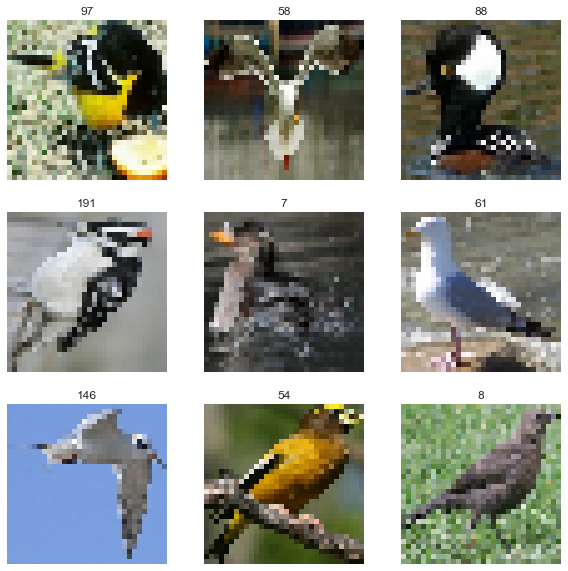

In [6]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_data.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(int(labels[i]))
        plt.axis("off")

In [51]:
model = tf.keras.models.Sequential([
])
model.add(tf.keras.layers.InputLayer(input_shape=( 32, 32, 3 ))),
model.add(tf.keras.layers.Flatten()),
model.add(tf.keras.layers.Dense(2048, activation='relu'))
model.add(tf.keras.layers.Dense(2048, activation='relu'))
model.add(Dropout(0.4))
model.add(tf.keras.layers.Dense(1024, activation='relu'))
model.add(tf.keras.layers.Dense(1024, activation='relu'))
model.add(Dropout(0.4))
model.add(tf.keras.layers.Dense(512, activation='relu'))
model.add(tf.keras.layers.Dense(512, activation='relu'))

model.add(tf.keras.layers.Dense(265, activation='relu'))
model.add(tf.keras.layers.Dense(265, activation='relu'))

model.add(tf.keras.layers.Dense(200, activation='sigmoid'))

model.compile(optimizer='Adam', loss='sparse_categorical_crossentropy', metrics='accuracy')
print(model.summary())

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 flatten_15 (Flatten)        (None, 3072)              0         
                                                                 
 dense_77 (Dense)            (None, 2048)              6293504   
                                                                 
 dense_78 (Dense)            (None, 2048)              4196352   
                                                                 
 dropout_26 (Dropout)        (None, 2048)              0         
                                                                 
 dense_79 (Dense)            (None, 1024)              2098176   
                                                                 
 dense_80 (Dense)            (None, 1024)              1049600   
                                                                 
 dropout_27 (Dropout)        (None, 1024)             

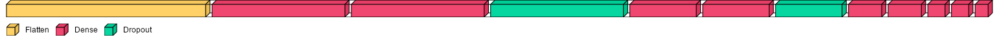

In [49]:
from PIL import ImageFont
font = ImageFont.truetype("arial.ttf", 12)
visualkeras.layered_view(model, legend=True, font=font)

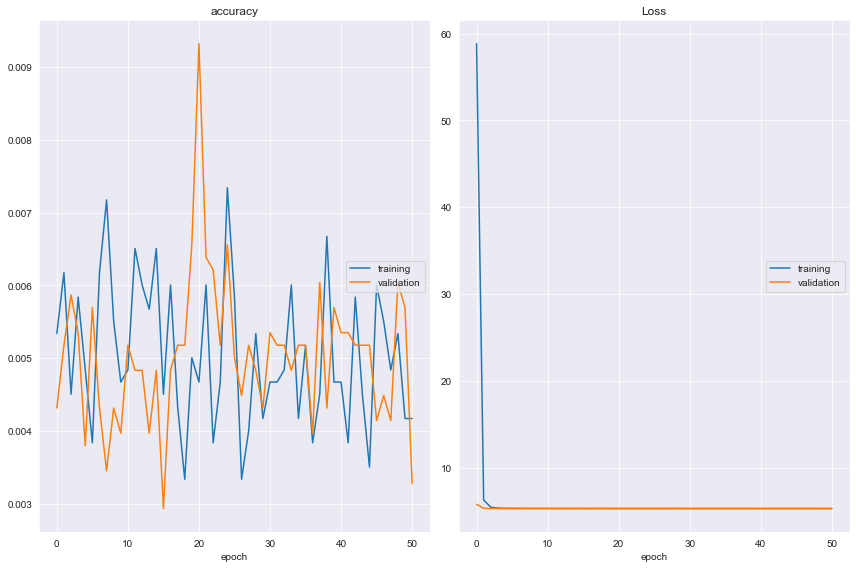

accuracy
	training         	 (min:    0.003, max:    0.007, cur:    0.004)
	validation       	 (min:    0.003, max:    0.009, cur:    0.003)
Loss
	training         	 (min:    5.297, max:   58.835, cur:    5.298)
	validation       	 (min:    5.295, max:    5.786, cur:    5.297)
6/6 [==============================] - 3s 338ms/step - loss: 5.2975 - accuracy: 0.0042 - val_loss: 5.2968 - val_accuracy: 0.0033


In [52]:
history = model.fit(train_data,validation_data=test_data ,epochs=num_epoch,callbacks= [PlotLossesKeras(),tf.keras.callbacks.EarlyStopping(monitor='loss', patience=10)])

## Part 2. ResNet-101 (4 Marks)

For this section you will adapt the ResNet-101 network for the current task using tranfer learning and fine-tuning. You will implement the following in your process:
- You should choose a suitable image size.
- Choose a suitable labelling scheme.
- Use the pretrained ResNet-101 network available in Keras.
- Remove the top fully connected layers. Include your own FC layers that match our dataset.
- Choose some layers to "freeze" and the remaining layers you will fine-tune with the new dataset.

### Step 1
You will use the above steps to train a ResNet-101 model using the Bird dataset
- Use transfer learning to train your first model by removing the FC layers, but leaving the other layers intact.
- Plot a loss curve for training and test data
- Plot an accuracy curve for training and test data

### Step 2
Now use the same steps as above, but this time unfreeze some convolutional layers and retrain the network. Again, plot your results.

### Step 3
Discuss the results of both methods from step 1 and step 2 while using plots and graphics to support your discussion.


In [33]:
from tensorflow.keras.applications.resnet import ResNet101
base_model = ResNet101(include_top=False, input_shape=(32, 32, 3), classes= 200)
base_model.trainable = False    #Freeze all Layers of ResNET
base_model.summary()

Model: "resnet101"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 38, 38, 3)    0           ['input_5[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 16, 16, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 16, 16, 64)   256         ['conv1_conv[0][0]']             
                                                                                          

In [39]:
model_freeze = base_model.layers[-1].output # last layer output
model_freeze = Flatten()(model_freeze)
model_freeze = Dense(1024, activation='relu')(model_freeze)
model_freeze = Dense(1024, activation='relu')(model_freeze)
model_freeze = Dropout(0.4)(model_freeze)
model_freeze = Dense(512, activation='relu')(model_freeze)
model_freeze = Dense(512, activation='relu')(model_freeze)
model_freeze = Dropout(0.4)(model_freeze)
model_freeze = Dense(512, activation='relu')(model_freeze)
model_freeze = Dense(512, activation='relu')(model_freeze)
model_freeze = Dropout(0.4)(model_freeze)

model_freeze = Dense(201, activation='softmax')(model_freeze)

model_freeze = Model(inputs=base_model.input, outputs=model_freeze)

model_freeze.compile(loss = "sparse_categorical_crossentropy",optimizer='Adam' ,metrics=['accuracy'])
model_freeze.summary()

Model: "model_9"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_5 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 38, 38, 3)    0           ['input_5[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 16, 16, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 16, 16, 64)   256         ['conv1_conv[0][0]']             
                                                                                            

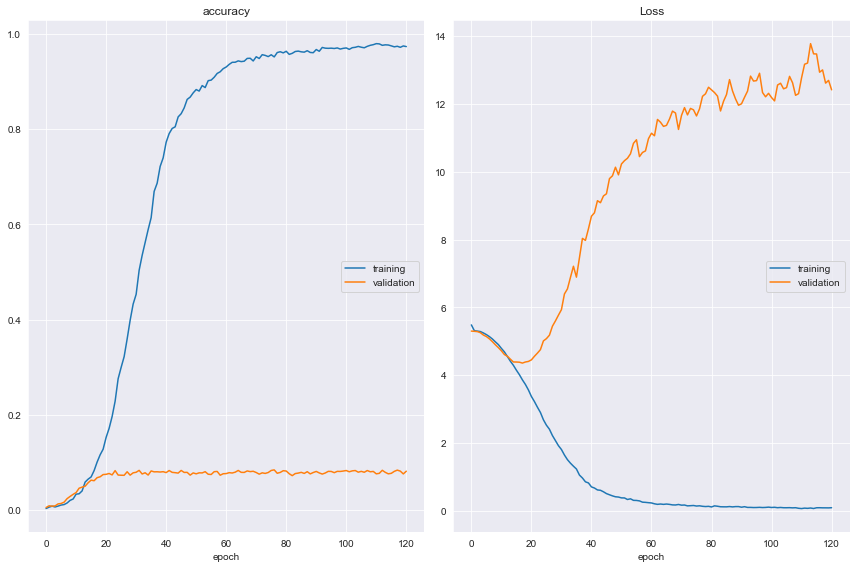

accuracy
	training         	 (min:    0.003, max:    0.980, cur:    0.973)
	validation       	 (min:    0.005, max:    0.084, cur:    0.082)
Loss
	training         	 (min:    0.065, max:    5.482, cur:    0.090)
	validation       	 (min:    4.356, max:   13.778, cur:   12.416)
6/6 [==============================] - 4s 609ms/step - loss: 0.0895 - accuracy: 0.9735 - val_loss: 12.4161 - val_accuracy: 0.0816


In [40]:
history1 = model_freeze.fit(train_data,validation_data=(test_data) ,epochs=num_epoch,callbacks= [PlotLossesKeras(),tf.keras.callbacks.EarlyStopping(monitor='loss', patience=10)])

In [45]:
base_model_2 = ResNet101(include_top=False, input_shape=(32, 32, 3))
base_model_2.trainable = False

for layer in base_model_2.layers[-10:]:
    layer.trainable = True

model_unfreeze = base_model_2.layers[-1].output # last layers output
model_unfreeze = Flatten()(model_unfreeze)
model_unfreeze = Dense(1024, activation='relu')(model_unfreeze)
model_unfreeze = Dense(1024, activation='relu')(model_unfreeze)
model_unfreeze = Dropout(0.4)(model_unfreeze)
model_unfreeze = Dense(512, activation='relu')(model_unfreeze)
model_unfreeze = Dense(512, activation='relu')(model_unfreeze)
model_unfreeze = Dropout(0.4)(model_unfreeze)
model_unfreeze = Dense(512, activation='relu')(model_unfreeze)
model_unfreeze = Dense(512, activation='relu')(model_unfreeze)
model_unfreeze = Dropout(0.4)(model_unfreeze)

model_unfreeze = Dense(201, activation='softmax')(model_unfreeze)

model_unfreeze = Model(inputs=base_model_2.input, outputs=model_unfreeze)

model_unfreeze.compile(loss = "sparse_categorical_crossentropy",optimizer='Adam',metrics=['accuracy'])

model_unfreeze.summary()

Model: "model_12"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_9 (InputLayer)           [(None, 32, 32, 3)]  0           []                               
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 38, 38, 3)    0           ['input_9[0][0]']                
                                                                                                  
 conv1_conv (Conv2D)            (None, 16, 16, 64)   9472        ['conv1_pad[0][0]']              
                                                                                                  
 conv1_bn (BatchNormalization)  (None, 16, 16, 64)   256         ['conv1_conv[0][0]']             
                                                                                           

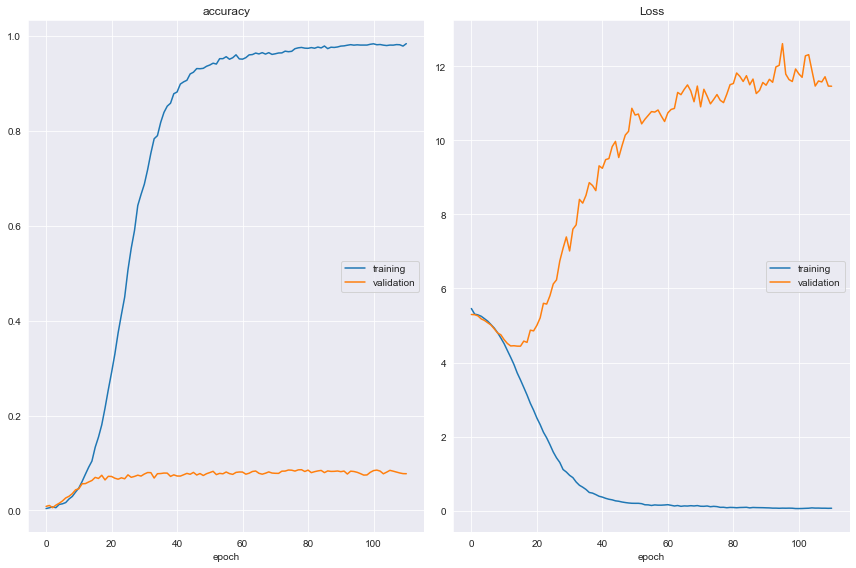

accuracy
	training         	 (min:    0.004, max:    0.984, cur:    0.984)
	validation       	 (min:    0.006, max:    0.086, cur:    0.077)
Loss
	training         	 (min:    0.054, max:    5.458, cur:    0.063)
	validation       	 (min:    4.441, max:   12.615, cur:   11.465)
6/6 [==============================] - 4s 593ms/step - loss: 0.0626 - accuracy: 0.9842 - val_loss: 11.4652 - val_accuracy: 0.0773


In [46]:
history2 = model_unfreeze.fit(train_data,validation_data=(test_data) ,epochs=num_epoch,callbacks= [PlotLossesKeras(),tf.keras.callbacks.EarlyStopping(monitor='loss', patience=10)])

Write your discussion here.

## Part 3. Visualization (3 Marks)

For this section you will visualize the filters learned byyour ResNet-101 network and use t-SNE to observe clusters that were learned by your model.
- Make sure to provide the graphic results for your visualizations
- Provide an interpretation of the results

## Bonus (1 Mark)
Visualize the activation maps produced by your network and discuss the results using an image from the test test and another image of your choice.

conv1_conv (7, 7, 3, 64)


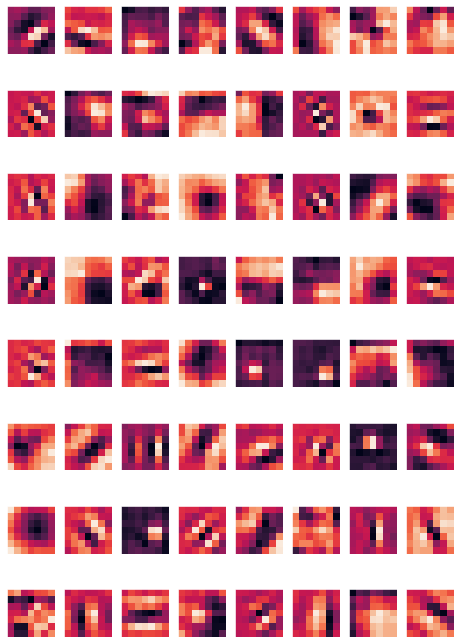

In [93]:
filters, biases = model_freeze.layers[2].get_weights()
print(model_freeze.layers[2].name, filters.shape)
# plot filters
fig=plt.figure(figsize=(8, 12))
columns = 8
rows = 8
n_filters = columns * rows
for i in range(1, n_filters +1):
    f = filters[:, :, :, i-1]
    fig =plt.subplot(rows, columns, i)
    fig.set_xticks([])  #Turn off axis
    fig.set_yticks([])
    plt.imshow(f[:, :, 0])
plt.show()

In [100]:
feat_extractor = Model(inputs=model_unfreeze.input,
                       outputs=model_unfreeze.get_layer('flatten_13').output)
features = feat_extractor.predict(test_data, batch_size=4)

6/6 [==============================] - 83s 210ms/step


In [101]:
import numpy as np
from sklearn.manifold import TSNE
tsne = TSNE().fit_transform(features)
tx, ty = tsne[:,0], tsne[:,1]
tx = (tx-np.min(tx)) / (np.max(tx) - np.min(tx))
ty = (ty-np.min(ty)) / (np.max(ty) - np.min(ty))

C:\Users\LENOVO\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:800: FutureWarning: The default initialization in TSNE will change from 'random' to 'pca' in 1.2.
  warnings.warn(
C:\Users\LENOVO\AppData\Local\Programs\Python\Python310\lib\site-packages\sklearn\manifold\_t_sne.py:810: FutureWarning: The default learning rate in TSNE will change from 200.0 to 'auto' in 1.2.
  warnings.warn(


C:\Users\LENOVO\AppData\Local\Temp\ipykernel_6316\3224798071.py:14: DeprecationWarning: ANTIALIAS is deprecated and will be removed in Pillow 10 (2023-07-01). Use Resampling.LANCZOS instead.
  Image.ANTIALIAS)


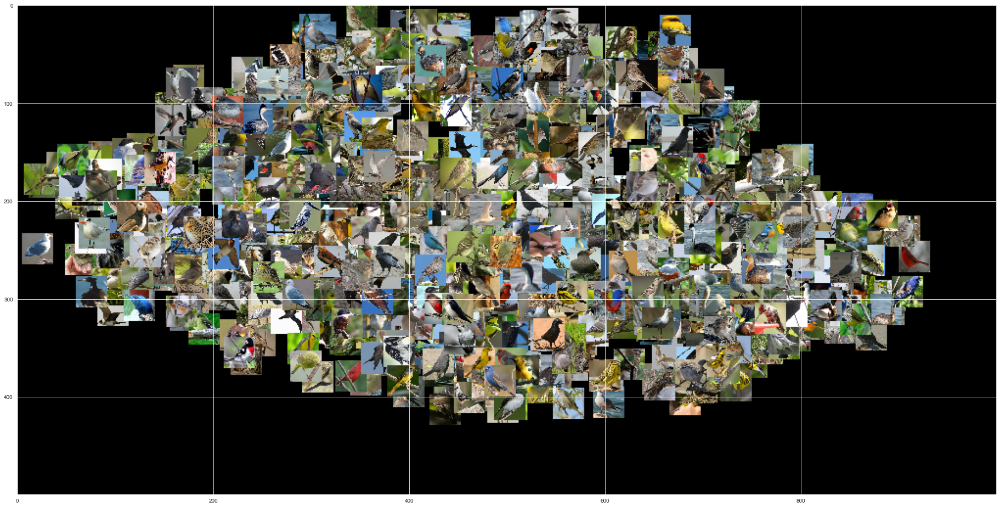

In [102]:
import matplotlib.pyplot as plt
from PIL import Image
width = 1000
height = 500
max_dim = 100
full_image = Image.new('RGB', (width, height))
plt.figure(figsize=(32, 32))
for patchnum, patchs in  enumerate(test_data):
    for imagesnumber, images in enumerate(patchs[0]):
        tile = Image.fromarray(images.numpy().astype("uint8"))
        rs = max(1, tile.width / max_dim, tile.height / max_dim)
        tile = tile.resize((int(tile.width / rs),
                            int(tile.height / rs)),
                           Image.ANTIALIAS)
        full_image.paste(tile, (int((width-max_dim) * tx[imagesnumber+patchnum ]),
                                int((height-max_dim) * ty[imagesnumber+patchnum ])))
plt.imshow(full_image)

Discuss here.